In [87]:
import numpy as np
import pandas as pd
import os 

# Import visualization modules
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
%matplotlib inline

In [88]:
bt

,OutboundUtilzation (%),Score,isAnomaly
Timestamp,,,
2017-10-10 07:00:00,96.2442,0.0,0
2017-10-10 07:05:00,96.2442,0.0,0
2017-10-10 07:10:00,96.2442,0.0,0
2017-10-10 07:15:00,96.2442,0.0,0
2017-10-10 07:20:00,99.1131,0.0,0
...,...,...,...
2018-03-25 23:40:00,65.8425,0.0,0
2018-03-25 23:45:00,56.8811,0.0,0
2018-03-25 23:50:00,43.6352,0.0,0


In [89]:
bt = pd.read_csv('BT.csv',parse_dates=['Timestamp'], infer_datetime_format=True)
# bt['Timestamp']=pd.to_datetime(df['Timestamp'])

In [90]:
bt = bt.set_index('Timestamp')

In [91]:
bt = bt.resample('5Min').mean()

In [92]:
bt

,Unnamed: 0,OutboundUtilzation (%)
Timestamp,,
2017-10-10 07:00:00,0.0,96.2442
2017-10-10 07:05:00,NaN,NaN
2017-10-10 07:10:00,NaN,NaN
2017-10-10 07:15:00,NaN,NaN
2017-10-10 07:20:00,1.0,99.1131
...,...,...
2018-03-25 23:40:00,20690.0,65.8425
2018-03-25 23:45:00,20691.0,56.8811
2018-03-25 23:50:00,20692.0,43.6352


In [93]:
bt.isnull().sum()

Unnamed: 0                1698
OutboundUtilzation (%)    1698
dtype: int64

In [94]:
bt = bt.drop('Unnamed: 0',1)

In [97]:
bt = bt.ffill()
bt = bt.reset_index()

In [128]:
from luminol.anomaly_detector import AnomalyDetector
ts = bt['OutboundUtilzation (%)'].to_dict()

a =  {'precision':5,'lag_window_size':400,'future_window_size':400,'chunk_size':2}

my_detector = AnomalyDetector(ts) # ,algorithm_params=a
y = my_detector
score = my_detector.get_all_scores()


score_list = []
for timestamp, score in score.iteritems():
    score_list.append(score)
    print(timestamp, score)

0 0.0
1 0.0
2 0.0
3 0.0
4 0.0
5 0.0
6 0.0
7 0.0
8 0.0
9 0.0
10 0.0
11 0.0
12 0.0
13 0.0
14 0.0
15 0.0
16 0.0
17 0.0
18 0.0
19 0.0
20 0.0
21 0.0
22 0.0
23 0.0
24 0.0
25 0.0
26 0.0
27 0.0
28 0.0
29 0.0
30 0.0
31 0.0
32 0.0
33 0.0
34 0.0
35 0.0
36 0.0
37 0.0
38 0.0
39 0.0
40 0.0
41 0.0
42 0.0
43 0.0
44 0.0
45 0.0
46 0.0
47 0.0
48 0.0
49 0.0
50 0.0
51 0.0
52 0.0
53 0.0
54 0.0
55 0.0
56 0.0
57 0.0
58 0.0
59 0.0
60 0.0
61 0.0
62 0.0
63 0.0
64 0.0
65 0.0
66 0.0
67 0.0
68 0.0
69 0.0
70 0.0
71 0.0
72 0.0
73 0.0
74 0.0
75 0.0
76 0.0
77 0.0
78 0.0
79 0.0
80 0.0
81 0.0
82 0.0
83 0.0
84 0.0
85 0.0
86 0.0
87 0.0
88 0.0
89 0.0
90 0.0
91 0.0
92 0.0
93 0.0
94 0.0
95 0.0
96 0.0
97 0.0
98 0.0
99 0.0
100 0.0
101 0.0
102 0.0
103 0.0
104 0.0
105 0.0
106 0.0
107 0.0
108 0.0
109 0.0
110 0.0
111 0.0
112 0.0
113 0.0
114 0.0
115 0.0
116 0.0
117 0.0
118 0.0
119 0.0
120 0.0
121 0.0
122 0.0
123 0.0
124 0.0
125 0.0
126 0.0
127 0.0
128 0.0
129 0.0
130 0.0
131 0.0
132 0.0
133 0.0
134 0.0
135 0.0
136 0.0
137 0.0
138 0.

1200 4606.0
1201 4642.0
1202 4510.0
1203 4400.0
1204 4288.0
1205 4184.0
1206 4146.0
1207 4210.0
1208 4214.0
1209 4154.0
1210 4042.0
1211 3852.0
1212 3738.0
1213 3676.0
1214 3598.0
1215 3484.0
1216 3330.0
1217 3214.0
1218 3220.0
1219 3378.0
1220 3508.0
1221 3564.0
1222 3628.0
1223 3594.0
1224 3396.0
1225 3242.0
1226 3090.0
1227 2964.0
1228 2856.0
1229 2804.0
1230 2824.0
1231 2798.0
1232 2804.0
1233 2796.0
1234 2726.0
1235 2536.0
1236 2412.0
1237 2324.0
1238 2160.0
1239 2040.0
1240 1948.0
1241 1994.0
1242 2044.0
1243 2030.0
1244 1968.0
1245 1874.0
1246 1700.0
1247 1598.0
1248 1560.0
1249 1508.0
1250 1460.0
1251 1430.0
1252 1402.0
1253 1444.0
1254 1358.0
1255 1230.0
1256 1114.0
1257 1012.0
1258 948.0
1259 880.0
1260 802.0
1261 734.0
1262 716.0
1263 690.0
1264 634.0
1265 610.0
1266 576.0
1267 500.0
1268 462.0
1269 418.0
1270 398.0
1271 378.0
1272 392.0
1273 388.0
1274 406.0
1275 436.0
1276 452.0
1277 500.0
1278 564.0
1279 644.0
1280 702.0
1281 784.0
1282 868.0
1283 990.0
1284 1096.0
1285 1

3080 210.0
3081 210.0
3082 212.0
3083 218.0
3084 234.0
3085 246.0
3086 258.0
3087 278.0
3088 304.0
3089 326.0
3090 346.0
3091 372.0
3092 412.0
3093 474.0
3094 542.0
3095 622.0
3096 714.0
3097 788.0
3098 816.0
3099 856.0
3100 930.0
3101 884.0
3102 778.0
3103 718.0
3104 682.0
3105 636.0
3106 642.0
3107 696.0
3108 712.0
3109 692.0
3110 680.0
3111 658.0
3112 616.0
3113 576.0
3114 548.0
3115 520.0
3116 506.0
3117 524.0
3118 560.0
3119 626.0
3120 722.0
3121 806.0
3122 862.0
3123 918.0
3124 990.0
3125 1032.0
3126 1058.0
3127 1064.0
3128 1000.0
3129 926.0
3130 922.0
3131 948.0
3132 954.0
3133 930.0
3134 930.0
3135 904.0
3136 828.0
3137 768.0
3138 780.0
3139 782.0
3140 754.0
3141 742.0
3142 772.0
3143 814.0
3144 888.0
3145 916.0
3146 930.0
3147 964.0
3148 1012.0
3149 1040.0
3150 1112.0
3151 1140.0
3152 1148.0
3153 1164.0
3154 1130.0
3155 1130.0
3156 1156.0
3157 1210.0
3158 1284.0
3159 1332.0
3160 1256.0
3161 1210.0
3162 1130.0
3163 1024.0
3164 994.0
3165 976.0
3166 900.0
3167 836.0
3168 850.0
3

4722 6428.0
4723 6116.0
4724 5820.0
4725 5540.0
4726 5350.0
4727 5208.0
4728 5076.0
4729 5052.0
4730 5034.0
4731 5140.0
4732 5258.0
4733 5388.0
4734 5520.0
4735 5640.0
4736 5660.0
4737 5460.0
4738 5202.0
4739 4956.0
4740 4722.0
4741 4500.0
4742 4354.0
4743 4216.0
4744 4026.0
4745 3848.0
4746 3732.0
4747 3826.0
4748 3918.0
4749 3862.0
4750 3714.0
4751 3570.0
4752 3430.0
4753 3206.0
4754 2950.0
4755 2710.0
4756 2522.0
4757 2452.0
4758 2452.0
4759 2452.0
4760 2452.0
4761 2414.0
4762 2380.0
4763 2314.0
4764 2210.0
4765 2110.0
4766 2014.0
4767 1922.0
4768 1862.0
4769 1862.0
4770 1746.0
4771 1614.0
4772 1568.0
4773 1522.0
4774 1450.0
4775 1382.0
4776 1318.0
4777 1258.0
4778 1202.0
4779 1172.0
4780 1142.0
4781 1094.0
4782 1072.0
4783 1072.0
4784 1050.0
4785 1010.0
4786 974.0
4787 942.0
4788 932.0
4789 946.0
4790 1000.0
4791 996.0
4792 942.0
4793 892.0
4794 846.0
4795 804.0
4796 766.0
4797 764.0
4798 800.0
4799 778.0
4800 690.0
4801 594.0
4802 570.0
4803 604.0
4804 632.0
4805 632.0
4806 612.0


6493 6186.0
6494 6114.0
6495 6058.0
6496 6018.0
6497 5994.0
6498 6070.0
6499 6154.0
6500 6128.0
6501 6100.0
6502 6180.0
6503 6358.0
6504 6540.0
6505 6640.0
6506 6664.0
6507 6774.0
6508 6964.0
6509 7044.0
6510 7130.0
6511 7328.0
6512 7530.0
6513 7698.0
6514 7870.0
6515 8044.0
6516 8218.0
6517 8428.0
6518 8678.0
6519 8844.0
6520 8792.0
6521 8448.0
6522 8114.0
6523 7908.0
6524 7592.0
6525 7224.0
6526 6866.0
6527 6520.0
6528 6148.0
6529 5874.0
6530 5700.0
6531 5530.0
6532 5280.0
6533 4988.0
6534 4672.0
6535 4402.0
6536 4122.0
6537 3922.0
6538 3860.0
6539 3924.0
6540 3988.0
6541 3988.0
6542 3922.0
6543 3734.0
6544 3494.0
6545 3270.0
6546 3062.0
6547 2962.0
6548 3012.0
6549 3168.0
6550 3330.0
6551 3390.0
6552 3390.0
6553 3328.0
6554 3220.0
6555 3164.0
6556 3110.0
6557 3010.0
6558 2914.0
6559 2822.0
6560 2734.0
6561 2692.0
6562 2692.0
6563 2652.0
6564 2610.0
6565 2612.0
6566 2576.0
6567 2500.0
6568 2428.0
6569 2360.0
6570 2296.0
6571 2236.0
6572 2156.0
6573 2044.0
6574 1970.0
6575 1948.0
6576

8721 4164.0
8722 4082.0
8723 3992.0
8724 4072.0
8725 4164.0
8726 4146.0
8727 4052.0
8728 4052.0
8729 4052.0
8730 4052.0
8731 4052.0
8732 3896.0
8733 3708.0
8734 3610.0
8735 3516.0
8736 3356.0
8737 3274.0
8738 3194.0
8739 3128.0
8740 3128.0
8741 3024.0
8742 2876.0
8743 2740.0
8744 2538.0
8745 2274.0
8746 2026.0
8747 1854.0
8748 1720.0
8749 1628.0
8750 1518.0
8751 1384.0
8752 1272.0
8753 1156.0
8754 1044.0
8755 892.0
8756 756.0
8757 636.0
8758 558.0
8759 502.0
8760 458.0
8761 418.0
8762 390.0
8763 374.0
8764 370.0
8765 378.0
8766 378.0
8767 366.0
8768 370.0
8769 390.0
8770 432.0
8771 492.0
8772 520.0
8773 552.0
8774 588.0
8775 628.0
8776 672.0
8777 720.0
8778 708.0
8779 768.0
8780 892.0
8781 1032.0
8782 1188.0
8783 1360.0
8784 1548.0
8785 1752.0
8786 1972.0
8787 2208.0
8788 2372.0
8789 2588.0
8790 2798.0
8791 3056.0
8792 3326.0
8793 3584.0
8794 3776.0
8795 3820.0
8796 4014.0
8797 4272.0
8798 4508.0
8799 4682.0
8800 4732.0
8801 4760.0
8802 4774.0
8803 4794.0
8804 4838.0
8805 4908.0
8806 5

10471 1918.0
10472 1914.0
10473 1778.0
10474 1574.0
10475 1386.0
10476 1214.0
10477 1060.0
10478 1050.0
10479 1058.0
10480 1058.0
10481 926.0
10482 864.0
10483 792.0
10484 724.0
10485 734.0
10486 756.0
10487 708.0
10488 646.0
10489 588.0
10490 490.0
10491 398.0
10492 352.0
10493 318.0
10494 294.0
10495 280.0
10496 244.0
10497 254.0
10498 274.0
10499 278.0
10500 280.0
10501 342.0
10502 384.0
10503 410.0
10504 448.0
10505 504.0
10506 568.0
10507 652.0
10508 746.0
10509 848.0
10510 984.0
10511 1136.0
10512 1268.0
10513 1336.0
10514 1376.0
10515 1432.0
10516 1456.0
10517 1458.0
10518 1422.0
10519 1468.0
10520 1538.0
10521 1560.0
10522 1616.0
10523 1756.0
10524 1918.0
10525 2034.0
10526 2154.0
10527 2348.0
10528 2546.0
10529 2688.0
10530 2768.0
10531 2938.0
10532 3098.0
10533 3238.0
10534 3388.0
10535 3550.0
10536 3634.0
10537 3750.0
10538 3828.0
10539 3776.0
10540 3694.0
10541 3750.0
10542 3846.0
10543 3880.0
10544 3964.0
10545 3964.0
10546 3964.0
10547 4066.0
10548 4162.0
10549 4284.0
105

12221 1532.0
12222 1586.0
12223 1586.0
12224 1520.0
12225 1452.0
12226 1494.0
12227 1604.0
12228 1718.0
12229 1836.0
12230 1954.0
12231 1956.0
12232 1904.0
12233 1844.0
12234 1682.0
12235 1524.0
12236 1456.0
12237 1560.0
12238 1734.0
12239 1924.0
12240 2128.0
12241 2294.0
12242 2384.0
12243 2464.0
12244 2464.0
12245 2468.0
12246 2348.0
12247 2262.0
12248 2274.0
12249 2420.0
12250 2576.0
12251 2654.0
12252 2820.0
12253 3080.0
12254 3324.0
12255 3578.0
12256 3870.0
12257 4174.0
12258 4462.0
12259 4756.0
12260 5092.0
12261 5440.0
12262 5670.0
12263 5744.0
12264 5754.0
12265 5690.0
12266 5514.0
12267 5350.0
12268 5214.0
12269 5238.0
12270 5380.0
12271 5526.0
12272 5798.0
12273 6164.0
12274 6542.0
12275 6932.0
12276 7248.0
12277 7288.0
12278 7190.0
12279 7092.0
12280 6920.0
12281 6716.0
12282 6520.0
12283 6336.0
12284 6288.0
12285 6338.0
12286 6400.0
12287 6492.0
12288 6514.0
12289 6414.0
12290 6434.0
12291 6574.0
12292 6596.0
12293 6402.0
12294 6120.0
12295 5850.0
12296 5708.0
12297 5658.0

14221 980.0
14222 844.0
14223 734.0
14224 678.0
14225 618.0
14226 522.0
14227 442.0
14228 378.0
14229 330.0
14230 298.0
14231 282.0
14232 282.0
14233 298.0
14234 328.0
14235 348.0
14236 372.0
14237 400.0
14238 432.0
14239 468.0
14240 508.0
14241 552.0
14242 600.0
14243 652.0
14244 708.0
14245 768.0
14246 832.0
14247 900.0
14248 972.0
14249 1048.0
14250 1128.0
14251 1210.0
14252 1248.0
14253 1232.0
14254 1174.0
14255 1128.0
14256 1144.0
14257 1186.0
14258 1244.0
14259 1294.0
14260 1346.0
14261 1468.0
14262 1648.0
14263 1840.0
14264 2020.0
14265 2146.0
14266 2208.0
14267 2208.0
14268 2274.0
14269 2408.0
14270 2478.0
14271 2488.0
14272 2630.0
14273 2854.0
14274 3026.0
14275 3274.0
14276 3598.0
14277 3938.0
14278 4188.0
14279 4288.0
14280 4368.0
14281 4558.0
14282 4860.0
14283 5138.0
14284 5430.0
14285 5760.0
14286 5866.0
14287 5960.0
14288 6062.0
14289 6082.0
14290 6208.0
14291 6474.0
14292 6842.0
14293 7210.0
14294 7210.0
14295 7114.0
14296 7352.0
14297 7836.0
14298 8336.0
14299 8698.0
1

15635 8098.0
15636 7844.0
15637 7502.0
15638 7172.0
15639 6854.0
15640 6628.0
15641 6490.0
15642 6276.0
15643 5990.0
15644 5734.0
15645 5558.0
15646 5320.0
15647 5072.0
15648 4944.0
15649 4828.0
15650 4612.0
15651 4516.0
15652 4498.0
15653 4492.0
15654 4504.0
15655 4484.0
15656 4356.0
15657 4312.0
15658 4364.0
15659 4426.0
15660 4388.0
15661 4362.0
15662 4348.0
15663 4356.0
15664 4268.0
15665 4104.0
15666 3956.0
15667 3918.0
15668 3968.0
15669 4008.0
15670 4108.0
15671 4210.0
15672 4264.0
15673 4260.0
15674 4180.0
15675 4116.0
15676 4068.0
15677 4036.0
15678 4020.0
15679 4020.0
15680 4036.0
15681 4068.0
15682 4116.0
15683 4180.0
15684 4306.0
15685 4528.0
15686 4676.0
15687 4792.0
15688 4938.0
15689 5096.0
15690 5286.0
15691 5572.0
15692 5870.0
15693 6092.0
15694 6296.0
15695 6516.0
15696 6752.0
15697 7014.0
15698 7248.0
15699 7614.0
15700 7994.0
15701 8386.0
15702 8790.0
15703 8966.0
15704 8992.0
15705 9008.0
15706 9004.0
15707 8906.0
15708 8882.0
15709 8816.0
15710 8904.0
15711 9002.0

17720 392.0
17721 480.0
17722 580.0
17723 692.0
17724 816.0
17725 952.0
17726 1100.0
17727 1260.0
17728 1432.0
17729 1608.0
17730 1812.0
17731 2008.0
17732 2224.0
17733 2452.0
17734 2682.0
17735 2920.0
17736 3076.0
17737 3108.0
17738 3178.0
17739 3378.0
17740 3690.0
17741 4018.0
17742 4362.0
17743 4668.0
17744 4940.0
17745 5232.0
17746 5540.0
17747 5864.0
17748 6204.0
17749 6378.0
17750 6378.0
17751 6420.0
17752 6650.0
17753 6978.0
17754 7320.0
17755 7724.0
17756 8086.0
17757 8300.0
17758 8518.0
17759 8740.0
17760 9134.0
17761 9602.0
17762 10086.0
17763 10586.0
17764 10918.0
17765 10934.0
17766 10922.0
17767 10992.0
17768 11092.0
17769 11114.0
17770 11106.0
17771 11130.0
17772 11390.0
17773 11654.0
17774 12106.0
17775 12566.0
17776 12846.0
17777 13130.0
17778 13418.0
17779 13638.0
17780 13662.0
17781 13690.0
17782 13818.0
17783 13920.0
17784 13850.0
17785 13782.0
17786 13884.0
17787 14096.0
17788 14320.0
17789 14744.0
17790 15368.0
17791 16008.0
17792 16664.0
17793 17132.0
17794 17270.

19271 1470.0
19272 1608.0
19273 1754.0
19274 1900.0
19275 2058.0
19276 2238.0
19277 2388.0
19278 2566.0
19279 2640.0
19280 2686.0
19281 2698.0
19282 2674.0
19283 2662.0
19284 2696.0
19285 2764.0
19286 2826.0
19287 2836.0
19288 2870.0
19289 2910.0
19290 2958.0
19291 3008.0
19292 3036.0
19293 2996.0
19294 2982.0
19295 2980.0
19296 2958.0
19297 2888.0
19298 2908.0
19299 2910.0
19300 2842.0
19301 2820.0
19302 2802.0
19303 2762.0
19304 2726.0
19305 2694.0
19306 2640.0
19307 2566.0
19308 2518.0
19309 2470.0
19310 2450.0
19311 2478.0
19312 2526.0
19313 2628.0
19314 2734.0
19315 2788.0
19316 2844.0
19317 2844.0
19318 2844.0
19319 2844.0
19320 2844.0
19321 2864.0
19322 2864.0
19323 2888.0
19324 2984.0
19325 3104.0
19326 3164.0
19327 3164.0
19328 3038.0
19329 2984.0
19330 2860.0
19331 2690.0
19332 2588.0
19333 2488.0
19334 2452.0
19335 2402.0
19336 2360.0
19337 2324.0
19338 2292.0
19339 2264.0
19340 2240.0
19341 2220.0
19342 2204.0
19343 2210.0
19344 2226.0
19345 2192.0
19346 2162.0
19347 2166.0

21220 3648.0
21221 3648.0
21222 3648.0
21223 3724.0
21224 3792.0
21225 3864.0
21226 3940.0
21227 4020.0
21228 4104.0
21229 4192.0
21230 4282.0
21231 4374.0
21232 4544.0
21233 4792.0
21234 5052.0
21235 5226.0
21236 5314.0
21237 5312.0
21238 5130.0
21239 4862.0
21240 4696.0
21241 4672.0
21242 4648.0
21243 4476.0
21244 4362.0
21245 4222.0
21246 4116.0
21247 3952.0
21248 3878.0
21249 3966.0
21250 4042.0
21251 4110.0
21252 4106.0
21253 4086.0
21254 4024.0
21255 3966.0
21256 3912.0
21257 3884.0
21258 3898.0
21259 3910.0
21260 3920.0
21261 3942.0
21262 3976.0
21263 4022.0
21264 4080.0
21265 4194.0
21266 4296.0
21267 4410.0
21268 4510.0
21269 4480.0
21270 4340.0
21271 4204.0
21272 4182.0
21273 4172.0
21274 4146.0
21275 4130.0
21276 4152.0
21277 4298.0
21278 4338.0
21279 4358.0
21280 4350.0
21281 4118.0
21282 3866.0
21283 3626.0
21284 3498.0
21285 3502.0
21286 3508.0
21287 3394.0
21288 3186.0
21289 3086.0
21290 3092.0
21291 3106.0
21292 3128.0
21293 3030.0
21294 2886.0
21295 2892.0
21296 2930.0

23143 1826.0
23144 1852.0
23145 1864.0
23146 1850.0
23147 1850.0
23148 1850.0
23149 1850.0
23150 1840.0
23151 1762.0
23152 1618.0
23153 1440.0
23154 1240.0
23155 1082.0
23156 974.0
23157 890.0
23158 822.0
23159 770.0
23160 734.0
23161 712.0
23162 652.0
23163 620.0
23164 576.0
23165 560.0
23166 572.0
23167 600.0
23168 644.0
23169 704.0
23170 780.0
23171 872.0
23172 980.0
23173 1104.0
23174 1244.0
23175 1400.0
23176 1572.0
23177 1760.0
23178 1964.0
23179 2184.0
23180 2420.0
23181 2672.0
23182 2940.0
23183 3224.0
23184 3524.0
23185 3840.0
23186 4172.0
23187 4520.0
23188 4884.0
23189 5146.0
23190 5302.0
23191 5472.0
23192 5660.0
23193 5866.0
23194 6190.0
23195 6626.0
23196 7078.0
23197 7434.0
23198 7540.0
23199 7482.0
23200 7520.0
23201 7714.0
23202 7954.0
23203 8172.0
23204 8368.0
23205 8580.0
23206 8808.0
23207 9052.0
23208 9166.0
23209 9176.0
23210 9208.0
23211 9234.0
23212 9254.0
23213 9286.0
23214 9330.0
23215 9346.0
23216 9256.0
23217 9064.0
23218 8888.0
23219 8728.0
23220 8686.0
232

25116 2500.0
25117 2462.0
25118 2426.0
25119 2426.0
25120 2426.0
25121 2426.0
25122 2426.0
25123 2426.0
25124 2426.0
25125 2426.0
25126 2426.0
25127 2426.0
25128 2426.0
25129 2474.0
25130 2578.0
25131 2634.0
25132 2634.0
25133 2634.0
25134 2578.0
25135 2454.0
25136 2334.0
25137 2272.0
25138 2212.0
25139 2100.0
25140 1992.0
25141 1940.0
25142 1890.0
25143 1790.0
25144 1694.0
25145 1602.0
25146 1514.0
25147 1478.0
25148 1444.0
25149 1342.0
25150 1292.0
25151 1312.0
25152 1288.0
25153 1222.0
25154 1160.0
25155 1102.0
25156 1048.0
25157 998.0
25158 952.0
25159 926.0
25160 888.0
25161 832.0
25162 816.0
25163 856.0
25164 908.0
25165 972.0
25166 1048.0
25167 1136.0
25168 1236.0
25169 1348.0
25170 1414.0
25171 1482.0
25172 1566.0
25173 1666.0
25174 1722.0
25175 1650.0
25176 1648.0
25177 1722.0
25178 1798.0
25179 1914.0
25180 2034.0
25181 2158.0
25182 2374.0
25183 2558.0
25184 2558.0
25185 2558.0
25186 2558.0
25187 2558.0
25188 2754.0
25189 2980.0
25190 3174.0
25191 3400.0
25192 3556.0
25193 35

26969 22068.0
26970 21516.0
26971 20976.0
26972 20448.0
26973 20448.0
26974 20576.0
26975 20450.0
26976 20586.0
26977 20724.0
26978 20472.0
26979 20222.0
26980 20472.0
26981 20724.0
26982 20724.0
26983 20724.0
26984 20724.0
26985 20724.0
26986 20724.0
26987 20724.0
26988 20724.0
26989 20472.0
26990 20082.0
26991 19696.0
26992 19450.0
26993 19590.0
26994 19976.0
26995 20366.0
26996 20760.0
26997 21158.0
26998 21560.0
26999 21966.0
27000 22120.0
27001 21868.0
27002 21462.0
27003 21060.0
27004 20658.0
27005 20152.0
27006 19654.0
27007 19178.0
27008 18704.0
27009 18232.0
27010 17776.0
27011 17336.0
27012 16906.0
27013 16334.0
27014 15626.0
27015 14934.0
27016 14258.0
27017 13598.0
27018 13086.0
27019 12720.0
27020 12368.0
27021 12022.0
27022 11546.0
27023 11082.0
27024 10762.0
27025 10454.0
27026 10158.0
27027 9858.0
27028 9706.0
27029 9706.0
27030 9706.0
27031 9706.0
27032 9706.0
27033 9706.0
27034 9706.0
27035 9558.0
27036 9142.0
27037 8610.0
27038 8226.0
27039 7986.0
27040 7622.0
27041 

28308 30342.0
28309 30342.0
28310 30628.0
28311 31118.0
28312 31612.0
28313 31904.0
28314 31904.0
28315 31904.0
28316 31612.0
28317 30832.0
28318 29860.0
28319 28904.0
28320 27964.0
28321 27040.0
28322 26132.0
28323 25420.0
28324 25160.0
28325 24904.0
28326 24216.0
28327 23356.0
28328 22512.0
28329 21684.0
28330 20872.0
28331 20076.0
28332 19296.0
28333 18532.0
28334 17784.0
28335 17052.0
28336 16336.0
28337 15770.0
28338 15552.0
28339 15344.0
28340 15002.0
28341 14664.0
28342 14330.0
28343 13870.0
28344 13226.0
28345 12598.0
28346 12170.0
28347 11868.0
28348 11570.0
28349 11276.0
28350 10986.0
28351 10808.0
28352 10746.0
28353 10576.0
28354 10184.0
28355 9742.0
28356 9580.0
28357 9742.0
28358 10016.0
28359 10294.0
28360 10408.0
28361 10244.0
28362 10082.0
28363 10044.0
28364 9890.0
28365 9616.0
28366 9346.0
28367 9080.0
28368 8818.0
28369 8560.0
28370 8306.0
28371 8056.0
28372 7810.0
28373 7476.0
28374 7170.0
28375 6876.0
28376 6572.0
28377 6354.0
28378 6140.0
28379 5930.0
28380 5656.

30218 2234.0
30219 2250.0
30220 2260.0
30221 2264.0
30222 2256.0
30223 2304.0
30224 2376.0
30225 2342.0
30226 2258.0
30227 2234.0
30228 2264.0
30229 2346.0
30230 2432.0
30231 2526.0
30232 2628.0
30233 2738.0
30234 2826.0
30235 2978.0
30236 3146.0
30237 3330.0
30238 3446.0
30239 3550.0
30240 3658.0
30241 3770.0
30242 3918.0
30243 4166.0
30244 4430.0
30245 4710.0
30246 4902.0
30247 5054.0
30248 5266.0
30249 5594.0
30250 5938.0
30251 6196.0
30252 6466.0
30253 6850.0
30254 7250.0
30255 7538.0
30256 7638.0
30257 7860.0
30258 8216.0
30259 8456.0
30260 8604.0
30261 8864.0
30262 9132.0
30263 9296.0
30264 9544.0
30265 9798.0
30266 9974.0
30267 10154.0
30268 10338.0
30269 10662.0
30270 11116.0
30271 11582.0
30272 11992.0
30273 12286.0
30274 12346.0
30275 12134.0
30276 11858.0
30277 11638.0
30278 11440.0
30279 11246.0
30280 10938.0
30281 10498.0
30282 10136.0
30283 9852.0
30284 9510.0
30285 9180.0
30286 8860.0
30287 8482.0
30288 8190.0
30289 7980.0
30290 7700.0
30291 7498.0
30292 7570.0
30293 769

32191 622.0
32192 576.0
32193 534.0
32194 496.0
32195 462.0
32196 432.0
32197 406.0
32198 392.0
32199 364.0
32200 352.0
32201 356.0
32202 376.0
32203 412.0
32204 464.0
32205 532.0
32206 616.0
32207 716.0
32208 818.0
32209 880.0
32210 946.0
32211 1016.0
32212 1090.0
32213 1168.0
32214 1250.0
32215 1402.0
32216 1590.0
32217 1794.0
32218 2014.0
32219 2250.0
32220 2502.0
32221 2770.0
32222 3002.0
32223 3248.0
32224 3556.0
32225 3772.0
32226 3832.0
32227 3664.0
32228 3520.0
32229 3548.0
32230 3692.0
32231 3852.0
32232 4028.0
32233 4220.0
32234 4428.0
32235 4652.0
32236 4868.0
32237 5256.0
32238 5660.0
32239 6080.0
32240 6424.0
32241 6712.0
32242 6846.0
32243 6984.0
32244 7294.0
32245 7674.0
32246 8158.0
32247 8658.0
32248 9174.0
32249 9706.0
32250 10254.0
32251 10722.0
32252 11008.0
32253 11298.0
32254 11476.0
32255 11656.0
32256 11954.0
32257 12256.0
32258 12562.0
32259 12752.0
32260 12950.0
32261 13152.0
32262 13358.0
32263 13568.0
32264 13782.0
32265 14206.0
32266 14862.0
32267 15304.0
3

34218 1256.0
34219 1348.0
34220 1490.0
34221 1698.0
34222 1922.0
34223 2096.0
34224 2220.0
34225 2348.0
34226 2480.0
34227 2616.0
34228 2756.0
34229 2900.0
34230 3048.0
34231 3200.0
34232 3356.0
34233 3516.0
34234 3680.0
34235 3848.0
34236 4020.0
34237 4196.0
34238 4376.0
34239 4560.0
34240 4748.0
34241 4840.0
34242 4904.0
34243 4972.0
34244 5044.0
34245 5142.0
34246 5142.0
34247 5142.0
34248 5040.0
34249 4942.0
34250 5044.0
34251 5244.0
34252 5448.0
34253 5656.0
34254 5758.0
34255 5866.0
34256 6082.0
34257 6302.0
34258 6412.0
34259 6306.0
34260 6180.0
34261 5966.0
34262 5752.0
34263 5542.0
34264 5336.0
34265 5134.0
34266 4936.0
34267 4938.0
34268 5156.0
34269 5154.0
34270 4848.0
34271 4564.0
34272 4390.0
34273 4128.0
34274 3780.0
34275 3448.0
34276 3132.0
34277 2920.0
34278 2864.0
34279 2864.0
34280 2864.0
34281 2864.0
34282 2922.0
34283 3136.0
34284 3288.0
34285 3320.0
34286 3420.0
34287 3546.0
34288 3712.0
34289 3882.0
34290 3984.0
34291 3916.0
34292 3746.0
34293 3580.0
34294 3418.0

36218 8314.0
36219 8566.0
36220 8970.0
36221 9400.0
36222 9840.0
36223 10132.0
36224 10166.0
36225 10068.0
36226 10068.0
36227 9952.0
36228 9796.0
36229 9914.0
36230 10188.0
36231 10212.0
36232 9964.0
36233 9694.0
36234 9428.0
36235 9166.0
36236 8908.0
36237 8654.0
36238 8404.0
36239 8158.0
36240 7916.0
36241 7678.0
36242 7546.0
36243 7708.0
36244 8016.0
36245 8182.0
36246 8286.0
36247 8286.0
36248 8364.0
36249 8336.0
36250 8076.0
36251 7810.0
36252 7868.0
36253 7952.0
36254 7952.0
36255 7952.0
36256 7848.0
36257 7610.0
36258 7512.0
36259 7512.0
36260 7342.0
36261 7180.0
36262 7180.0
36263 7250.0
36264 7382.0
36265 7510.0
36266 7664.0
36267 7752.0
36268 7752.0
36269 7752.0
36270 7650.0
36271 7554.0
36272 7376.0
36273 7056.0
36274 6744.0
36275 6524.0
36276 6524.0
36277 6692.0
36278 6872.0
36279 7198.0
36280 7670.0
36281 8070.0
36282 8492.0
36283 8912.0
36284 9436.0
36285 9818.0
36286 9818.0
36287 9664.0
36288 9784.0
36289 10058.0
36290 10336.0
36291 10618.0
36292 10904.0
36293 11194.0
3

37773 14156.0
37774 14302.0
37775 14452.0
37776 14412.0
37777 14222.0
37778 14032.0
37779 13996.0
37780 14150.0
37781 14308.0
37782 14276.0
37783 13982.0
37784 13622.0
37785 13274.0
37786 12938.0
37787 12614.0
37788 12302.0
37789 12002.0
37790 11714.0
37791 11450.0
37792 11026.0
37793 10618.0
37794 10226.0
37795 9850.0
37796 9490.0
37797 9296.0
37798 9100.0
37799 8916.0
37800 8752.0
37801 8606.0
37802 8456.0
37803 8304.0
37804 8164.0
37805 8036.0
37806 7920.0
37807 7816.0
37808 7724.0
37809 7644.0
37810 7534.0
37811 7274.0
37812 7054.0
37813 6962.0
37814 6854.0
37815 6782.0
37816 6722.0
37817 6644.0
37818 6598.0
37819 6586.0
37820 6586.0
37821 6702.0
37822 6822.0
37823 6902.0
37824 6986.0
37825 6938.0
37826 6942.0
37827 6998.0
37828 7066.0
37829 7146.0
37830 7238.0
37831 7342.0
37832 7380.0
37833 7322.0
37834 7202.0
37835 7206.0
37836 7334.0
37837 7362.0
37838 7290.0
37839 7234.0
37840 7194.0
37841 7170.0
37842 7162.0
37843 7170.0
37844 7194.0
37845 7314.0
37846 7530.0
37847 7674.0
378

39717 11574.0
39718 11300.0
39719 11208.0
39720 11146.0
39721 11156.0
39722 11136.0
39723 11156.0
39724 11392.0
39725 11644.0
39726 11874.0
39727 12108.0
39728 12346.0
39729 12588.0
39730 12588.0
39731 12346.0
39732 12108.0
39733 12060.0
39734 12060.0
39735 12060.0
39736 12096.0
39737 12110.0
39738 12334.0
39739 12316.0
39740 12114.0
39741 11874.0
39742 11638.0
39743 11406.0
39744 11216.0
39745 11026.0
39746 10802.0
39747 10620.0
39748 10362.0
39749 10108.0
39750 9858.0
39751 9676.0
39752 9494.0
39753 9092.0
39754 8762.0
39755 8560.0
39756 8362.0
39757 8168.0
39758 7978.0
39759 7792.0
39760 7610.0
39761 7432.0
39762 7258.0
39763 7088.0
39764 6922.0
39765 6760.0
39766 6612.0
39767 6404.0
39768 6200.0
39769 5878.0
39770 5518.0
39771 5170.0
39772 4834.0
39773 4550.0
39774 4380.0
39775 4116.0
39776 3852.0
39777 3594.0
39778 3358.0
39779 3216.0
39780 3078.0
39781 2944.0
39782 2740.0
39783 2500.0
39784 2272.0
39785 2056.0
39786 1890.0
39787 1790.0
39788 1694.0
39789 1602.0
39790 1468.0
39791

41199 1324.0
41200 1478.0
41201 1546.0
41202 1460.0
41203 1328.0
41204 1246.0
41205 1314.0
41206 1424.0
41207 1546.0
41208 1680.0
41209 1756.0
41210 1778.0
41211 1810.0
41212 1840.0
41213 1934.0
41214 2040.0
41215 2044.0
41216 2006.0
41217 1980.0
41218 1966.0
41219 1964.0
41220 1974.0
41221 1996.0
41222 2030.0
41223 2034.0
41224 1982.0
41225 1868.0
41226 1826.0
41227 1800.0
41228 1778.0
41229 1760.0
41230 1746.0
41231 1754.0
41232 1790.0
41233 1838.0
41234 1872.0
41235 1902.0
41236 1876.0
41237 1862.0
41238 1860.0
41239 1870.0
41240 1938.0
41241 2030.0
41242 2072.0
41243 2086.0
41244 2030.0
41245 1922.0
41246 1806.0
41247 1732.0
41248 1668.0
41249 1610.0
41250 1592.0
41251 1588.0
41252 1528.0
41253 1472.0
41254 1420.0
41255 1372.0
41256 1364.0
41257 1374.0
41258 1376.0
41259 1358.0
41260 1370.0
41261 1388.0
41262 1442.0
41263 1562.0
41264 1648.0
41265 1696.0
41266 1808.0
41267 1868.0
41268 1824.0
41269 1842.0
41270 1980.0
41271 2166.0
41272 2364.0
41273 2504.0
41274 2510.0
41275 2498.0

43087 4702.0
43088 4452.0
43089 4354.0
43090 4270.0
43091 4174.0
43092 4198.0
43093 4334.0
43094 4324.0
43095 4220.0
43096 4124.0
43097 4122.0
43098 4228.0
43099 4338.0
43100 4596.0
43101 4896.0
43102 5182.0
43103 5476.0
43104 5642.0
43105 5628.0
43106 5590.0
43107 5556.0
43108 5526.0
43109 5500.0
43110 5462.0
43111 5420.0
43112 5390.0
43113 5382.0
43114 5552.0
43115 5894.0
43116 6082.0
43117 6090.0
43118 6078.0
43119 6086.0
43120 6284.0
43121 6628.0
43122 6952.0
43123 7284.0
43124 7472.0
43125 7460.0
43126 7422.0
43127 7388.0
43128 7382.0
43129 7380.0
43130 7350.0
43131 7324.0
43132 7302.0
43133 7284.0
43134 7242.0
43135 6878.0
43136 6700.0
43137 6530.0
43138 6364.0
43139 6202.0
43140 6206.0
43141 6062.0
43142 5930.0
43143 5810.0
43144 5830.0
43145 5968.0
43146 6282.0
43147 6608.0
43148 6772.0
43149 6808.0
43150 6644.0
43151 6496.0
43152 6356.0
43153 6182.0
43154 6032.0
43155 5934.0
43156 5806.0
43157 5558.0
43158 5428.0
43159 5590.0
43160 5754.0
43161 5760.0
43162 5748.0
43163 5806.0

44967 3780.0
44968 3688.0
44969 3594.0
44970 3522.0
44971 3456.0
44972 3394.0
44973 3356.0
44974 3316.0
44975 3284.0
44976 3334.0
44977 3386.0
44978 3386.0
44979 3386.0
44980 3386.0
44981 3428.0
44982 3530.0
44983 3610.0
44984 3588.0
44985 3562.0
44986 3594.0
44987 3650.0
44988 3640.0
44989 3628.0
44990 3742.0
44991 3828.0
44992 3954.0
44993 4194.0
44994 4454.0
44995 4716.0
44996 4998.0
44997 5184.0
44998 5266.0
44999 5258.0
45000 5156.0
45001 4960.0
45002 4652.0
45003 4280.0
45004 4088.0
45005 4004.0
45006 3828.0
45007 3558.0
45008 3382.0
45009 3228.0
45010 3162.0
45011 3100.0
45012 2974.0
45013 2776.0
45014 2590.0
45015 2416.0
45016 2220.0
45017 2044.0
45018 1952.0
45019 1818.0
45020 1678.0
45021 1532.0
45022 1462.0
45023 1426.0
45024 1402.0
45025 1390.0
45026 1358.0
45027 1454.0
45028 1616.0
45029 1722.0
45030 1884.0
45031 1958.0
45032 1956.0
45033 1944.0
45034 1946.0
45035 1938.0
45036 1916.0
45037 1898.0
45038 1918.0
45039 2054.0
45040 2274.0
45041 2440.0
45042 2536.0
45043 2624.0

47112 6470.0
47113 6590.0
47114 6818.0
47115 7050.0
47116 7166.0
47117 7266.0
47118 7370.0
47119 7478.0
47120 7472.0
47121 7330.0
47122 7190.0
47123 7082.0
47124 6982.0
47125 6872.0
47126 6642.0
47127 6306.0
47128 5972.0
47129 5752.0
47130 5654.0
47131 5574.0
47132 5608.0
47133 5512.0
47134 5380.0
47135 5278.0
47136 5202.0
47137 5112.0
47138 4814.0
47139 4524.0
47140 4246.0
47141 3980.0
47142 3706.0
47143 3462.0
47144 3204.0
47145 2980.0
47146 2768.0
47147 2568.0
47148 2428.0
47149 2428.0
47150 2366.0
47151 2236.0
47152 2048.0
47153 1882.0
47154 1750.0
47155 1640.0
47156 1552.0
47157 1520.0
47158 1492.0
47159 1468.0
47160 1414.0
47161 1358.0
47162 1314.0
47163 1214.0
47164 1158.0
47165 1092.0
47166 1030.0
47167 1032.0
47168 1040.0
47169 1022.0
47170 990.0
47171 938.0
47172 858.0
47173 762.0
47174 650.0
47175 554.0
47176 488.0
47177 454.0
47178 428.0
47179 384.0
47180 326.0
47181 312.0
47182 334.0
47183 358.0
47184 334.0
47185 294.0
47186 274.0
47187 242.0
47188 204.0
47189 184.0
47190 

In [129]:
anomalies = my_detector.get_anomalies()

In [130]:
for i in anomalies:
    print(i)

Anomaly from 264 to 289 with score 9636.0
Anomaly from 420 to 422 with score 7582.0
Anomaly from 2012 to 2014 with score 7534.0
Anomaly from 2021 to 2079 with score 10250.0
Anomaly from 2212 to 2218 with score 7530.0
Anomaly from 3931 to 4020 with score 10394.0
Anomaly from 4022 to 4022 with score 7386.0
Anomaly from 4025 to 4026 with score 7442.0
Anomaly from 4698 to 4700 with score 7398.0
Anomaly from 4704 to 4716 with score 7726.0
Anomaly from 5424 to 5471 with score 12962.0
Anomaly from 5564 to 5694 with score 27792.0
Anomaly from 5779 to 5855 with score 14032.0
Anomaly from 6512 to 6524 with score 8844.0
Anomaly from 6886 to 6975 with score 14196.0
Anomaly from 7573 to 7573 with score 7438.0
Anomaly from 7887 to 8103 with score 18904.0
Anomaly from 9230 to 9257 with score 10692.0
Anomaly from 9381 to 9484 with score 14520.0
Anomaly from 9840 to 9840 with score 7358.0
Anomaly from 9844 to 9847 with score 7950.0
Anomaly from 10847 to 10851 with score 7718.0
Anomaly from 11699 to 117

In [131]:
an_list = []
for a in anomalies:
    time_period = a.get_time_window()
    an_list.extend([i for i in range(time_period[0],time_period[1]+1)])

In [132]:
an_list

[264,
 265,
 266,
 267,
 268,
 269,
 270,
 271,
 272,
 273,
 274,
 275,
 276,
 277,
 278,
 279,
 280,
 281,
 282,
 283,
 284,
 285,
 286,
 287,
 288,
 289,
 420,
 421,
 422,
 2012,
 2013,
 2014,
 2021,
 2022,
 2023,
 2024,
 2025,
 2026,
 2027,
 2028,
 2029,
 2030,
 2031,
 2032,
 2033,
 2034,
 2035,
 2036,
 2037,
 2038,
 2039,
 2040,
 2041,
 2042,
 2043,
 2044,
 2045,
 2046,
 2047,
 2048,
 2049,
 2050,
 2051,
 2052,
 2053,
 2054,
 2055,
 2056,
 2057,
 2058,
 2059,
 2060,
 2061,
 2062,
 2063,
 2064,
 2065,
 2066,
 2067,
 2068,
 2069,
 2070,
 2071,
 2072,
 2073,
 2074,
 2075,
 2076,
 2077,
 2078,
 2079,
 2212,
 2213,
 2214,
 2215,
 2216,
 2217,
 2218,
 3931,
 3932,
 3933,
 3934,
 3935,
 3936,
 3937,
 3938,
 3939,
 3940,
 3941,
 3942,
 3943,
 3944,
 3945,
 3946,
 3947,
 3948,
 3949,
 3950,
 3951,
 3952,
 3953,
 3954,
 3955,
 3956,
 3957,
 3958,
 3959,
 3960,
 3961,
 3962,
 3963,
 3964,
 3965,
 3966,
 3967,
 3968,
 3969,
 3970,
 3971,
 3972,
 3973,
 3974,
 3975,
 3976,
 3977,
 3978,
 3979,


In [133]:
len(an_list)

9657

In [134]:
bt['Score'] = score_list
bt.head()

,Timestamp,OutboundUtilzation (%),Score,isAnomaly
0,2017-10-10 07:00:00,96.2442,0.0,0
1,2017-10-10 07:05:00,96.2442,0.0,0
2,2017-10-10 07:10:00,96.2442,0.0,0
3,2017-10-10 07:15:00,96.2442,0.0,0
4,2017-10-10 07:20:00,99.1131,0.0,0


In [138]:
max(score_list)

36782.0

In [135]:
bt['isAnomaly'] = 0
for i in an_list:
    bt.at[i,'isAnomaly'] = 1
    
bt[bt['isAnomaly']==1]

,Timestamp,OutboundUtilzation (%),Score,isAnomaly
264,2017-10-11 05:00:00,26.0014,7594.0,1
265,2017-10-11 05:05:00,76.3393,7704.0,1
266,2017-10-11 05:10:00,92.8581,7900.0,1
267,2017-10-11 05:15:00,79.9126,8156.0,1
268,2017-10-11 05:20:00,71.2066,8342.0,1
...,...,...,...,...
47537,2018-03-24 08:25:00,99.5234,8346.0,1
47538,2018-03-24 08:30:00,99.5281,8106.0,1
47539,2018-03-24 08:35:00,98.8228,7870.0,1
47540,2018-03-24 08:40:00,98.4674,7638.0,1


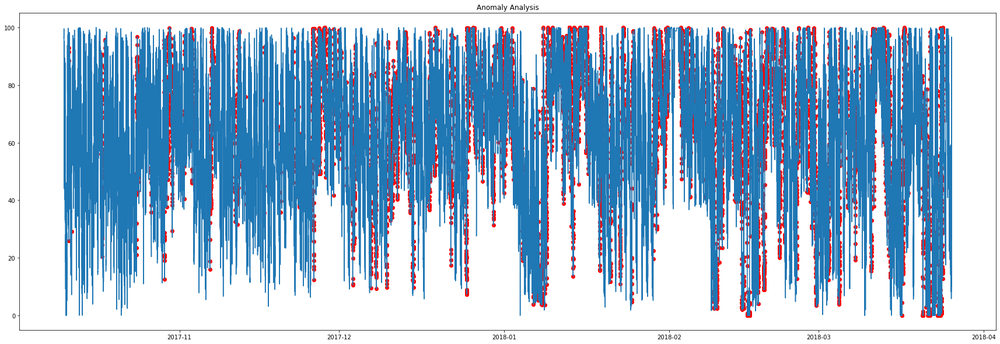

In [136]:
colors = {0:'green', 1:'red'}
   
plt.figure(figsize=(30,10))
plt.plot(bt['Timestamp'],bt['OutboundUtilzation (%)'])
plt.scatter(bt[bt['isAnomaly']==1]['Timestamp'],bt[bt['isAnomaly']==1]['OutboundUtilzation (%)'], color='red')
plt.title('Anomaly Analysis')
plt.show()

In [137]:
fig9 = px.line(bt, x='Timestamp', y='OutboundUtilzation (%)', title='Anomaly Analysis')


fig9.add_scatter(x=bt[bt['isAnomaly']==1]['Timestamp'],  y = bt[bt['isAnomaly']==1]['OutboundUtilzation (%)'],mode='markers')


fig9.update_xaxes(
    rangeslider_visible = True,
    rangeselector = dict(
        buttons = list([
            dict(count=1, label='1d', step='day', stepmode='backward'),
            dict(count=2, label='1m', step='month', stepmode='backward'),
            dict(step='all')
        ])
    )
)


fig2 = px.line(bt, x='Timestamp', y='Score', title='Score')
fig3 = px.line(bt, x='Timestamp', y='OutboundUtilzation (%)', title='Outbound Utilization (%)')

fig9.show()
fig2.show()
fig3.show()